# Outline

## 
1. Developing functions
2. Transfer time for each simulation + graph
3. Transfer time for each category + graph
4. Calculation of rates:
    4.1 Transfer rates
    4.2 Degradation rates
    4.3 Resuspension and burial rates
    4.4 Resurfacing rate + graph
5. Construction of matrices:
    5.1 EF matrix
    5.2 k, FF, CF matrices per simulation (Total:32)
    5.3 k, FF, CF matrices per category:
        - minimum and maximum k, FF, CF for each category
        - Range values for k, FF, CF
        - Graphs
        - Percentage of distribution
6. Sensitivity Analysis
7. Graphs
    7.1 Time for each MP category
    7.2 Residence time in sediments

In [2]:
import sys
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import math

# In oder not to have so many decimals
pd.set_option("display.float_format", "{:.2e}".format)

# 1. Developing functions

In [2]:
# To calculate the rate
def rate(time):
    return 1 / time

# 2. Transfer time for each simulation

In [3]:
file = pd.read_excel("Transfer_time6_6m_Raw_pyth.xlsx", None)

In [4]:
# Take the median value for: t_ws.wc (sinking from water surface to water column) and t_wc.sed (sedimentation from water column to sediments)
time_single_median = pd.DataFrame()

for i in file.keys():
    if i != "Template":
        time_single_median.loc[i, "t_ws.wc0"] = np.nanmedian(
            file[i].dropna(how="all").loc[:, "t_ws.wc"]
        )
        time_single_median.loc[i, "t_wc.sed0"] = np.nanmedian(
            file[i].dropna(how="all").loc[:, "t_wc.sed"]
        )

# 3. Transfer time for each category

In [5]:
# This cell adds the time t_ws.wc and t_wc.sed for each category from file and saves their median

time = pd.DataFrame(0, index=["Sp-HD-B","Sp-HD-S", "Sp-LD-B", "Sp-LD-S", "Cy-HD-B", "Cy-HD-S", "Cy-LD-B", "Cy-LD-S",], columns=["t_ws.wc", "t_wc.sed"],)

# In these lines, we are taking the nanmedian(to get the median without the nan) of k_ws.wc and adds them to median_ws
time.loc["Sp-HD-B", "t_ws.wc"] = np.nanmedian(pd.concat([file["Simulation2"], file["Simulation14"], file["Simulation22"], file["Simulation26"],]).dropna(how="all").loc[:, "t_ws.wc"])
time.loc["Sp-HD-S", "t_ws.wc"] = np.nanmedian(pd.concat([file["Simulation6"], file["Simulation10"], file["Simulation18"], file["Simulation30"],]).dropna(how="all").loc[:, "t_ws.wc"])
time.loc["Sp-LD-B", "t_ws.wc"] = np.nanmedian(pd.concat([file["Simulation5"], file["Simulation9"],  file["Simulation17"], file["Simulation29"],]).dropna(how="all").loc[:, "t_ws.wc"])
time.loc["Sp-LD-S", "t_ws.wc"] = np.nanmedian(pd.concat([file["Simulation1"], file["Simulation13"], file["Simulation21"], file["Simulation25"],]).dropna(how="all").loc[:, "t_ws.wc"])
time.loc["Cy-HD-B", "t_ws.wc"] = np.nanmedian(pd.concat([file["Simulation8"], file["Simulation12"], file["Simulation20"], file["Simulation32"],]).dropna(how="all").loc[:, "t_ws.wc"])
time.loc["Cy-HD-S", "t_ws.wc"] = np.nanmedian(pd.concat([file["Simulation4"], file["Simulation16"], file["Simulation24"], file["Simulation28"],]).dropna(how="all").loc[:, "t_ws.wc"])
time.loc["Cy-LD-B", "t_ws.wc"] = np.nanmedian(pd.concat([file["Simulation3"], file["Simulation15"], file["Simulation23"], file["Simulation27"],]).dropna(how="all").loc[:, "t_ws.wc"])
time.loc["Cy-LD-S", "t_ws.wc"] = np.nanmedian(pd.concat([file["Simulation7"], file["Simulation11"], file["Simulation19"], file["Simulation31"],]).dropna(how="all").loc[:, "t_ws.wc"])

# In these lines, we are taking the nanmedian(to get the median without the nan) of k_wc.sed and adds them to median_wc
time.loc["Sp-HD-B", "t_wc.sed"] = np.nanmedian(pd.concat([file["Simulation2"], file["Simulation14"], file["Simulation22"], file["Simulation26"],]).dropna(how="all").loc[:, "t_wc.sed"])
time.loc["Sp-HD-S", "t_wc.sed"] = np.nanmedian(pd.concat([file["Simulation6"], file["Simulation10"], file["Simulation18"], file["Simulation30"],]).dropna(how="all").loc[:, "t_wc.sed"])
time.loc["Sp-LD-B", "t_wc.sed"] = np.nanmedian(pd.concat([file["Simulation5"], file["Simulation9"], file["Simulation17"], file["Simulation29"],]).dropna(how="all").loc[:, "t_wc.sed"])
time.loc["Sp-LD-S", "t_wc.sed"] = np.nanmedian(pd.concat([file["Simulation1"], file["Simulation13"], file["Simulation21"], file["Simulation25"],]).dropna(how="all").loc[:, "t_wc.sed"])
time.loc["Cy-HD-B", "t_wc.sed"] = np.nanmedian(pd.concat([file["Simulation8"], file["Simulation12"], file["Simulation20"], file["Simulation32"],]).dropna(how="all").loc[:, "t_wc.sed"])
time.loc["Cy-HD-S", "t_wc.sed"] = np.nanmedian(pd.concat([file["Simulation4"], file["Simulation16"], file["Simulation24"], file["Simulation28"],]).dropna(how="all").loc[:, "t_wc.sed"])
time.loc["Cy-LD-B", "t_wc.sed"] = np.nanmedian(pd.concat([file["Simulation3"], file["Simulation15"], file["Simulation23"], file["Simulation27"],]).dropna(how="all").loc[:, "t_wc.sed"])
time.loc["Cy-LD-S", "t_wc.sed"] = np.nanmedian(pd.concat([file["Simulation7"], file["Simulation11"], file["Simulation19"], file["Simulation31"],]).dropna(how="all").loc[:, "t_wc.sed"])

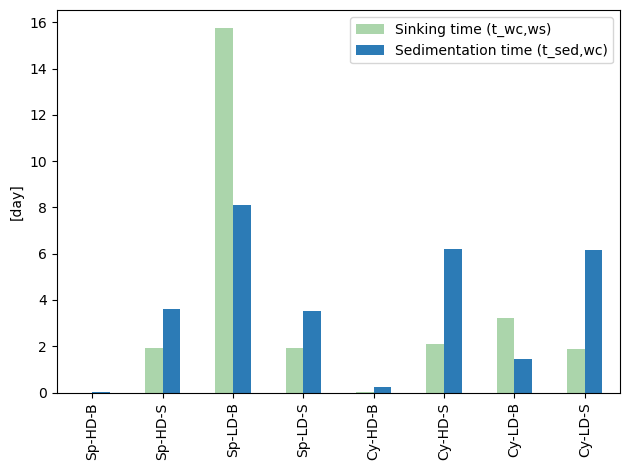

In [6]:
# Plot the sinking and sedimentation time per microplastic category
new_columns = {"t_ws.wc": "t_wc,ws", "t_wc.sed": "t_sed,wc"}
time.rename(columns=new_columns, inplace=True)

# Plotting the data
ax = time.plot(kind="bar", color=["#abd5ab", "#2c7bb6"])

# Set labels
plt.ylabel("[day]")
plt.tight_layout()

#Set legend
ax.legend(['Sinking time (t_wc,ws)','Sedimentation time (t_sed,wc)'])

# Save figure
#plt.savefig("TimePerCategories.eps", format="eps", dpi=1000)
plt.savefig("TimePerCategory.pdf", format="pdf", dpi=1000)

# 4. Calculate rates 

## 4.1 Transfer rates

In [7]:
# Emitting locations 

lat0 = [43.98452, 43.56431, 40.93734]
lon0 = [-63.97632, -69.12746, -70.49068]
dep0 = [-0.5, -0.5, -0.5]

In [8]:
# Calculate k_ws_wc (in day-1)
# Time is expressed in days

results_ws = pd.DataFrame()

for i in range(1, 33):
    data = file["Simulation" + str(i)]
    # to take the 150 rows and 9 columns only
    data = data.iloc[:150, :9]
    data = data.dropna(subset=["t_ws.wc"])
    k_ws_wc = []

    for j in data.index:
        k_ws_wc.append(rate(data.loc[j, "t_ws.wc"]))

    results_ws = pd.concat(
        [results_ws, pd.DataFrame([k_ws_wc], ["Simulation" + str(i)])]
    )

In [9]:
# Calculate k_wc_sed (in day-1)
# Time is expressed in days

results_wc = pd.DataFrame()

for i in range(1, 33):
    data = file["Simulation" + str(i)]
    data = data.iloc[:150, :9]
    k_wc_sed = []
    ratio = []

    for j in data.index:
        ratio.append((data.loc[j, "depf2"] - 6) / 94)

        k_wc_sed.append(ratio[j] * rate(data.loc[j, "t_wc.sed"]))

    results_wc = pd.concat(
        [results_wc, pd.DataFrame([k_wc_sed], ["Simulation" + str(i)])]
    )

In [10]:
# This cell adds the rates k_ws.wc and k_wc.sed for each category from results_ws and results_wc and saves their median

rates = pd.DataFrame(0,index=["Sp-HD-B","Sp-HD-S","Sp-LD-B","Sp-LD-S","Cy-HD-B","Cy-HD-S","Cy-LD-B","Cy-LD-S",],columns=["median_ws", "median_wc"],)

# In these lines, we are taking the nanmedian of k_ws.wc and adds them to median_ws
rates.loc["Sp-HD-B", "median_ws"] = np.nanmedian(results_ws.loc[["Simulation2", "Simulation14", "Simulation22", "Simulation26"]])
rates.loc["Sp-HD-S", "median_ws"] = np.nanmedian(results_ws.loc[["Simulation6", "Simulation10", "Simulation18", "Simulation30"]])
rates.loc["Sp-LD-B", "median_ws"] = np.nanmedian(results_ws.loc[["Simulation5", "Simulation9", "Simulation17", "Simulation29"]])
rates.loc["Sp-LD-S", "median_ws"] = np.nanmedian(results_ws.loc[["Simulation1", "Simulation13", "Simulation21", "Simulation25"]])
rates.loc["Cy-HD-B", "median_ws"] = np.nanmedian(results_ws.loc[["Simulation8", "Simulation12", "Simulation20", "Simulation32"]])
rates.loc["Cy-HD-S", "median_ws"] = np.nanmedian(results_ws.loc[["Simulation4", "Simulation16", "Simulation24", "Simulation28"]])
rates.loc["Cy-LD-B", "median_ws"] = np.nanmedian(results_ws.loc[["Simulation3", "Simulation15", "Simulation23", "Simulation27"]])
rates.loc["Cy-LD-S", "median_ws"] = np.nanmedian(results_ws.loc[["Simulation7", "Simulation11", "Simulation19", "Simulation31"]])

# In these lines, we are taking the nanmedian of k_wc.sed and adds them to median_wc
rates.loc["Sp-HD-B", "median_wc"] = np.nanmedian(results_wc.loc[["Simulation2", "Simulation14", "Simulation22", "Simulation26"]])
rates.loc["Sp-HD-S", "median_wc"] = np.nanmedian(results_wc.loc[["Simulation6", "Simulation10", "Simulation18", "Simulation30"]])
rates.loc["Sp-LD-B", "median_wc"] = np.nanmedian(results_wc.loc[["Simulation5", "Simulation9", "Simulation17", "Simulation29"]])
rates.loc["Sp-LD-S", "median_wc"] = np.nanmedian(results_wc.loc[["Simulation1", "Simulation13", "Simulation21", "Simulation25"]])
rates.loc["Cy-HD-B", "median_wc"] = np.nanmedian(results_wc.loc[["Simulation8", "Simulation12", "Simulation20", "Simulation32"]])
rates.loc["Cy-HD-S", "median_wc"] = np.nanmedian(results_wc.loc[["Simulation4", "Simulation16", "Simulation24", "Simulation28"]])
rates.loc["Cy-LD-B", "median_wc"] = np.nanmedian(results_wc.loc[["Simulation3", "Simulation15", "Simulation23", "Simulation27"]])
rates.loc["Cy-LD-S", "median_wc"] = np.nanmedian(results_wc.loc[["Simulation7", "Simulation11", "Simulation19", "Simulation31"]])

## 4.2 Degradation rate 

In [11]:
# Read the file for degradation (from Corella-Puertas et al., (2023))
degradation = pd.read_excel("SI_C_FFs.xlsx", None)

In [12]:
# Restructure the file by removing the first three rows
degradation["Degradation"] = degradation["Degradation"].drop([0, 1, 2])
# Set the third row (first after omitting the first ones) as the title for columns
degradation["Degradation"] = degradation["Degradation"].T.set_index([3]).T
# The first three columns are set in the index 
degradation["Degradation"] = degradation["Degradation"].set_index(["Polymer type", "Size [µm]", "Degradation scenario"])
degradation["Degradation"].columns.name = None

In [13]:
# Dictionaries are built for each microplastic category. Within them, dictionaries are built specify physical properties

categories = {
    "Sp-HD-B": {"shape": "Microbead/spherical shape", "type": "PET", "size": 5000},
    "Sp-HD-S": {"shape": "Microbead/spherical shape", "type": "PET", "size": 1},
    "Sp-LD-B": {"shape": "Microbead/spherical shape", "type": "EPS", "size": 5000},
    "Sp-LD-S": {"shape": "Microbead/spherical shape", "type": "EPS", "size": 1},
    "Cy-HD-B": {"shape": "Microfiber/cylindrical shape", "type": "PET", "size": 100},
    "Cy-HD-S": {"shape": "Microfiber/cylindrical shape", "type": "PET", "size": 1},
    "Cy-LD-B": {"shape": "Microfiber/cylindrical shape", "type": "EPS", "size": 100},
    "Cy-LD-S": {"shape": "Microfiber/cylindrical shape", "type": "EPS", "size": 1},
}

## 4.3 Resuspension and burial rates

In [14]:
# k_resuspension = v_resuspension/h_sediments
# h_sediments = 10 cm
# units of k_resuspension is day-1
# k_resuspension = v_resuspension /0.1

# v_resuspension is taken from the SimpleBox4plastic for continental sea water in m.day-1
v_resuspension = 2.26e-05  # m/d (in Simplebox model it is 2.62E-10 m/s)
k_resuspension = v_resuspension / 0.1

In [15]:
# k_burial = v_burial/h_sediments
# h_sediments = 10 cm
# units of k_burial is days-1

# k_burial is taken from the SimpleBox4plastic for continental sea water in day-1
# k_burial = 7.89e-05  # The original value is 9.13E-10 s-1
v_burial = 2.4e-6 # The original value is 2.74E-11 m.s-1
k_burial = v_burial/0.1 # The original value is 2.74E-10 s-1

## 4.4 Resurfacing rate 

In [16]:
# Time is in hours, load is in kg

data = {
    "Time": [3, 3.15, 3.3, 3.45, 4, 4.15, 4.3, 4.45, 5],
    "Total Load": [380, 425, 445, 470, 475, 505, 530, 555, 570],
    "Bed Load": [210, 230, 245, 255, 265, 280, 295, 305, 320],
    "Suspended Load": [170, 190, 200, 210, 210, 225, 230, 240, 250],
}
df = pd.DataFrame(data)

In [17]:
fig, axes = plt.subplots(1, 1, figsize=(16, 12), dpi=1000)

# create scatterplot
plt.plot(df["Time"], df["Total Load"], "o")
# obtain m (slope) and b(intercept) of linear regression line
m, b = np.polyfit(df["Time"], df["Total Load"], 1)

# add linear regression line to scatterplot
plt.plot(df["Time"], m * df["Time"] + b, color="red")
plt.xlabel("Time (hr)", fontsize=22)
plt.ylabel("Total Load(kg)", fontsize=22)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# display equation
equation = f"y = {m:.2f}x + {b:.2f}"
plt.text(3, 580, equation, fontsize=20, color="red")
plt.savefig("Total_load.pdf")
# plt.show()

In [18]:
# Unit is m3
V_bb = 10 * 0.05 * 3.55

# Density of sand beach (Voulgaris et al., 2008) = 2650 kg/m3

# Units of k_outs is in kg/hr
Q_out = m

# units of k_resurfacing is day-1
k_resurfacing = (Q_out * 24) / (2650 * V_bb)

# 5. Building matrices

## 5.1 Effect matrix

In [19]:
# The EF as updated by (Corella-Puertas, 2023)
# EF = 38.4 PAF.m3/kg
EF_matrix = pd.DataFrame(0,index=["Physical impacts on biota [PAF.m3/kg]"],columns=["b.C", "ws.C", "wc.C", "sed.C"],)
EF_matrix["ws.C"] = 38.4
EF_matrix["wc.C"] = 38.4

## 5.2 k, FF, CF for each simulation 

In [20]:
# Create a dictionary for each category to search within it for each simulation to know for which type of particles it is
# and then choose the degradation rates accordingly
dict_categories = {
    "Sp-HD-B": ["Simulation2", "Simulation14", "Simulation22", "Simulation26"],
    "Sp-HD-S": ["Simulation6", "Simulation10", "Simulation18", "Simulation30"],
    "Sp-LD-B": ["Simulation5", "Simulation9", "Simulation17", "Simulation29"],
    "Sp-LD-S": ["Simulation1", "Simulation13", "Simulation21", "Simulation25"],
    "Cy-HD-B": ["Simulation8", "Simulation12", "Simulation20", "Simulation32"],
    "Cy-HD-S": ["Simulation4", "Simulation16", "Simulation24", "Simulation28"],
    "Cy-LD-B": ["Simulation3", "Simulation15", "Simulation23", "Simulation27"],
    "Cy-LD-S": ["Simulation7", "Simulation11", "Simulation19", "Simulation31"],
}

In [21]:
# Building the k and FF matrix
k_matrix_single = {}
FF_matrix_single = {}
CF_matrix_single = {}
for i in file.keys():
    if i != "Template":
        k_matrix = pd.DataFrame(
            0,
            index=["b.C", "ws.C", "wc.C", "sed.C"],
            columns=["b.C", "ws.C", "wc.C", "sed.C"],
        )

        cat = list({k for k, v in dict_categories.items() if i in v})[0]
        k_deg_slow = (
            degradation["Degradation"].loc[
                (categories[cat]["type"], categories[cat]["size"], "Slow"),
                categories[cat]["shape"],
            ]
        ) / 365.25
        k_deg_fast = (
            degradation["Degradation"].loc[
                (categories[cat]["type"], categories[cat]["size"], "Fast"),
                categories[cat]["shape"],
            ]
        ) / 365.25
        k_deg_medium = (
            degradation["Degradation"].loc[
                (categories[cat]["type"], categories[cat]["size"], "Medium"),
                categories[cat]["shape"],
            ]
        ) / 365.25
        k_ws_wc = np.median(results_ws.loc[i, :].dropna())
        k_wc_sed = np.median(results_wc.loc[i, :].dropna())

        k_matrix.loc["b.C", "b.C"] = k_deg_fast - k_burial - k_resurfacing
        k_matrix.loc["ws.C", "b.C"] = k_resurfacing
        k_matrix.loc["ws.C", "ws.C"] = k_deg_medium - k_ws_wc
        k_matrix.loc["wc.C", "ws.C"] = k_ws_wc
        k_matrix.loc["wc.C", "wc.C"] = k_deg_slow - k_wc_sed
        k_matrix.loc["sed.C", "wc.C"] = k_wc_sed
        k_matrix.loc["wc.C", "sed.C"] = k_resuspension
        k_matrix.loc["sed.C", "sed.C"] = k_deg_slow - k_burial - k_resuspension

        FF_matrix_single[i] = pd.DataFrame(
            -np.linalg.inv(k_matrix),
            index=["b.C", "ws.C", "wc.C", "sed.C"],
            columns=["b.C", "ws.C", "wc.C", "sed.C"],
        )
        # FF_matrix_cat[cat] = pd.DataFrame(-np.linalg.inv(k_matrix), index =['ws.C', 'wc.C', 'sed.C'],
        # columns = ['ws.C', 'wc.C', 'sed.C'])
        # Calculate the CF matrix for each category
        CF_matrix_single[i] = EF_matrix.dot(FF_matrix_single[i])
        CF_matrix_single[i].index = ["Physical impacts on biota [PAF.m3.d/kg]"]

        k_matrix_single[i] = k_matrix

In [22]:
# Building the new matrices with the new format
k_single_newformat = pd.DataFrame()
FF_single_newformat = pd.DataFrame()
CF_single_newformat = pd.DataFrame()
for i in file.keys():
    if i != "Template":
        k_single_newformat = pd.concat([k_single_newformat, k_matrix_single[i]])
        FF_single_newformat = pd.concat([FF_single_newformat, FF_matrix_single[i]])
        CF_single_newformat = pd.concat([CF_single_newformat, CF_matrix_single[i]])

In [269]:
k_single_newformat.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\k_single.xlsx")

In [272]:
FF_single_newformat.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\FF_single.xlsx")

In [23]:
CF_single_newformat.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\CF_single_PAF.xlsx")

## 5.3 k, FF, CF for the categories

1. Create empty K_matrix (pandas dataframe) for one category
2. Load all K data into your Jupyter notebook (read_excel() of Elena's file, etc.)
3. Define categories as size, type, and shape
4. Store information in variables
5. Calculate the equations
6. Populate K_matrix with the different variable and equation

In [23]:
# Create the empty k matrix
k_matrix = pd.DataFrame(0, index=["b.C", "ws.C", "wc.C", "sed.C"], columns=["b.C", "ws.C", "wc.C", "sed.C"])

In [24]:
# Building the k and FF matrix
k_matrix_cat = {}
FF_matrix_cat = {}
CF_matrix_cat = {}
for cat in rates.index:
    k_matrix = pd.DataFrame(
        0,
        index=["b.C", "ws.C", "wc.C", "sed.C"],
        columns=["b.C", "ws.C", "wc.C", "sed.C"],
    )
    k_deg_slow = (
        degradation["Degradation"].loc[
            (categories[cat]["type"], categories[cat]["size"], "Slow"),
            categories[cat]["shape"],
        ]
    ) / 365.25
    k_deg_fast = (
        degradation["Degradation"].loc[
            (categories[cat]["type"], categories[cat]["size"], "Fast"),
            categories[cat]["shape"],
        ]
    ) / 365.25
    k_deg_medium = (
        degradation["Degradation"].loc[
            (categories[cat]["type"], categories[cat]["size"], "Medium"),
            categories[cat]["shape"],
        ]
    ) / 365.25
    k_ws_wc = rates.loc[cat, "median_ws"]
    k_wc_sed = rates.loc[cat, "median_wc"]

    k_matrix.loc["b.C", "b.C"] = k_deg_fast - k_burial - k_resurfacing
    k_matrix.loc["ws.C", "b.C"] = k_resurfacing
    k_matrix.loc["ws.C", "ws.C"] = k_deg_medium - k_ws_wc
    k_matrix.loc["wc.C", "ws.C"] = k_ws_wc
    k_matrix.loc["wc.C", "wc.C"] = k_deg_slow - k_wc_sed
    k_matrix.loc["sed.C", "wc.C"] = k_wc_sed
    k_matrix.loc["wc.C", "sed.C"] = k_resuspension
    k_matrix.loc["sed.C", "sed.C"] = k_deg_slow - k_burial - k_resuspension

    FF_matrix_cat[cat] = pd.DataFrame(
        -np.linalg.inv(k_matrix),
        index=["b.C", "ws.C", "wc.C", "sed.C"],
        columns=["b.C", "ws.C", "wc.C", "sed.C"],
    )
    
    CF_matrix_cat[cat] = EF_matrix.dot(FF_matrix_cat[cat])
    CF_matrix_cat[cat].index = ["Physical impacts on biota [PAF.m3.d/kg]"]

    k_matrix_cat[cat] = k_matrix

In [25]:
# create multiindex with category as first level index
for cat in FF_matrix_cat:
    FF_matrix_cat[cat].index = pd.MultiIndex.from_product([[cat], FF_matrix_cat[cat].index])
    CF_matrix_cat[cat].index = pd.MultiIndex.from_product([[cat], CF_matrix_cat[cat].index])
    k_matrix_cat[cat].index = pd.MultiIndex.from_product([[cat], k_matrix_cat[cat].index])

In [26]:
# concatenate all categories together to display them together
FF_matrix_total = pd.DataFrame()
CF_matrix_total = pd.DataFrame()
k_matrix_total = pd.DataFrame()
for cat in FF_matrix_cat:
    FF_matrix_total = pd.concat([FF_matrix_total, FF_matrix_cat[cat]])
    CF_matrix_total = pd.concat([CF_matrix_total, CF_matrix_cat[cat]])
    k_matrix_total = pd.concat([k_matrix_total, k_matrix_cat[cat]])

### 5.3.1 k matrix

In [43]:
k_matrix_total.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\k_matrix_cat.xlsx")

In [28]:
# To get the maximum value of each rate for each category

for cat in rates.index:
    k_deg_slow = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Slow"),categories[cat]["shape"],]) / 365.25
    k_deg_fast = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Fast"),categories[cat]["shape"],]) / 365.25
    k_deg_medium = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Medium"),categories[cat]["shape"],]) / 365.25
    k_ws_wc = rates.loc[cat, "median_ws"]
    k_wc_sed = rates.loc[cat, "median_wc"]

    dict_k = {
        k_deg_slow: "k_deg_slow",
        k_deg_fast: "k_deg_fast",
        k_deg_medium: "k_deg_medium",
        k_ws_wc: "k_ws_wc",
        k_wc_sed: "k_wc_sed",
        k_resurfacing: "k_resurfacing",
        k_burial: "k_burial",
        k_resuspension: "k_resuspension",
    }

    print("cat: " + cat + " / max k value: " + str(max(k_deg_slow,k_deg_fast,k_deg_medium,k_ws_wc,k_wc_sed,k_resurfacing,k_burial,k_resuspension,))
                  + " / k: " + dict_k[max(k_deg_slow,k_deg_fast,k_deg_medium,k_ws_wc,k_wc_sed,k_resurfacing,k_burial,k_resuspension,)])

cat: Sp-HD-B / max k value: 2025.2430879538379 / k: k_ws_wc
cat: Sp-HD-S / max k value: 0.5230080991700763 / k: k_ws_wc
cat: Sp-LD-B / max k value: 0.4503334851533756 / k: k_resurfacing
cat: Sp-LD-S / max k value: 0.5227087671581403 / k: k_ws_wc
cat: Cy-HD-B / max k value: 92.98278282679391 / k: k_ws_wc
cat: Cy-HD-S / max k value: 0.4780422733530546 / k: k_ws_wc
cat: Cy-LD-B / max k value: 0.4503334851533756 / k: k_resurfacing
cat: Cy-LD-S / max k value: 0.5277929539120468 / k: k_ws_wc


### 5.3.2 FF matrix 

In [45]:
FF_matrix_total.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\FF_matrix_cat.xlsx")

In [29]:
def get_max_FF(cat):
    return (FF_matrix_cat[cat][abs(FF_matrix_cat[cat]) == abs(FF_matrix_cat[cat]).max().max()].dropna(how="all").dropna(how="all", axis=1))

for cat in FF_matrix_cat.keys():
    print(
        "cat: "
        + cat
        + " / receiving comp: "
        + get_max_FF(cat).loc[cat].index[0]
        + " / emitting comp: "
        + get_max_FF(cat).loc[cat].columns[0]
        + " / value: "
        + str(get_max_FF(cat).iloc[0, 0])
    )

cat: Sp-HD-B / receiving comp: sed.C / emitting comp: sed.C / value: 41659.06289907544
cat: Sp-HD-S / receiving comp: sed.C / emitting comp: sed.C / value: 21775.56401665738
cat: Sp-LD-B / receiving comp: sed.C / emitting comp: sed.C / value: 41643.78910482907
cat: Sp-LD-S / receiving comp: sed.C / emitting comp: sed.C / value: 11140.490867167166
cat: Cy-HD-B / receiving comp: sed.C / emitting comp: sed.C / value: 41383.40082699706
cat: Cy-HD-S / receiving comp: sed.C / emitting comp: sed.C / value: 24722.655989120147
cat: Cy-LD-B / receiving comp: sed.C / emitting comp: sed.C / value: 40827.8867832847
cat: Cy-LD-S / receiving comp: sed.C / emitting comp: sed.C / value: 13633.889524772956


### 5.3.3 CF matrix 

In [30]:
# Get the maximum CF

def get_max_CF(cat):
    return (CF_matrix_cat[cat][
            abs(CF_matrix_cat[cat]) == abs(CF_matrix_cat[cat]).max().max()].dropna(how="all").dropna(how="all", axis=1))

for cat in CF_matrix_cat.keys():
    print(
        "cat: "
        + cat
        + " / receiving comp: "
        + get_max_CF(cat).loc[cat].index[0]
        + " / emitting comp: "
        + get_max_CF(cat).loc[cat].columns[0]
        + " / value: "
        + str(get_max_CF(cat).iloc[0, 0])
    )

cat: Sp-HD-B / receiving comp: Physical impacts on biota [PAF.m3.d/kg] / emitting comp: ws.C / value: 3.365913016486807
cat: Sp-HD-S / receiving comp: Physical impacts on biota [PAF.m3.d/kg] / emitting comp: ws.C / value: 989.1478297237188
cat: Sp-LD-B / receiving comp: Physical impacts on biota [PAF.m3.d/kg] / emitting comp: ws.C / value: 6397.141209371179
cat: Sp-LD-S / receiving comp: Physical impacts on biota [PAF.m3.d/kg] / emitting comp: ws.C / value: 559.2868365528767
cat: Cy-HD-B / receiving comp: Physical impacts on biota [PAF.m3.d/kg] / emitting comp: ws.C / value: 74.30281878172302
cat: Cy-HD-S / receiving comp: Physical impacts on biota [PAF.m3.d/kg] / emitting comp: ws.C / value: 1536.4371284920237
cat: Cy-LD-B / receiving comp: Physical impacts on biota [PAF.m3.d/kg] / emitting comp: ws.C / value: 1004.8082203176593
cat: Cy-LD-S / receiving comp: Physical impacts on biota [PAF.m3.d/kg] / emitting comp: ws.C / value: 982.122792792618


In [48]:
CF_matrix_total.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\CF_matrix_cat.xlsx")

### 5.3.4 Range values for each matrix 

In [31]:
# Building the new matrices with the new format
FF_newformat = pd.DataFrame()
CF_newformat = pd.DataFrame()
for i in rates.index:
    #     dff_fate_excel = pd.concat([FF_matrix_cat[i]], keys=[i])
    #     dff_CF_excel = pd.concat([CF_matrix_cat_PDF[i]], keys=[i])

    FF_newformat = pd.concat([FF_newformat, FF_matrix_cat[i]])
    CF_newformat = pd.concat([CF_newformat, CF_matrix_cat[i]])

In [32]:
FF_range_excel = pd.DataFrame(None,index=["b.C", "ws.C", "wc.C", "sed.C"],columns=["b.C", "ws.C", "wc.C", "sed.C"],)
CF_range_excel = pd.DataFrame(None,index=["b.C", "ws.C", "wc.C", "sed.C"],columns=["Physical impacts on biota [PAF.m3.d/kg]"],)

for i in ["b.C", "ws.C", "wc.C", "sed.C"]:
    CF_range_excel.loc[i, "Physical impacts on biota [PAF.m3.d/kg]"] = (CF_newformat.loc[:, i].min(),CF_newformat.loc[:, i].max(),)
    for j in ["b.C", "ws.C", "wc.C", "sed.C"]:
        FF_range_excel.loc[i, j] = (FF_newformat.loc(axis=0)[:,i].loc[:,j].min(),FF_newformat.loc(axis=0)[:,i].loc[:,j].max(),)

In [68]:
FF_range_excel.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\FF_range.xlsx")

In [69]:
CF_range_excel.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\CF_range.xlsx")

## 5.3.5 Percentage distribution

In [33]:
FF_matrix_total_distribution = pd.DataFrame()

for cat in dict_categories.keys():
    df = FF_matrix_total.loc[cat] / FF_matrix_total.loc[cat].sum(axis=0) * 100
    df = pd.concat([df], keys=[cat])
    FF_matrix_total_distribution = pd.concat([FF_matrix_total_distribution, df])

In [60]:
FF_matrix_total_distribution.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\FF_matrix_total_distribution.xlsx")

## 5.4 Environmental category

In [176]:
# Dictionaries are built for each environmental category

categories_env = {
    "kh_max-kv_max-BR_max": ['Simulation29','Simulation30','Simulation31','Simulation32'],
    "kh_max-kv_max-BR_min": ['Simulation25','Simulation26','Simulation27','Simulation28'],
    "kh_max-kv_min-BR_max": ['Simulation13','Simulation14','Simulation15','Simulation16'],
    "kh_max-kv_min-BR_min": ['Simulation9','Simulation10','Simulation11','Simulation12'],
    "kh_min-kv_max-BR_max": ['Simulation21','Simulation22','Simulation23','Simulation24'],
    "kh_min-kv_max-BR_min": ['Simulation17','Simulation18','Simulation19','Simulation20'],
    "kh_min-kv_min-BR_max": ['Simulation5','Simulation6','Simulation7','Simulation8'],
    "kh_min-kv_min-BR_min": ['Simulation1','Simulation2','Simulation3','Simulation4'],
}

In [177]:
CF_matrix_env = pd.DataFrame()

for sim in CF_matrix_single.keys():
    for i in categories_env:
        if sim in categories_env[i]:
            CF_matrix_single[sim].index = pd.MultiIndex.from_product([[i], [sim], ['Physical impacts on biota [PAF.m3.d/kg]']])
    CF_matrix_env = pd.concat([CF_matrix_env, CF_matrix_single[sim]])


In [179]:
CF_matrix_env.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\CF_env.xlsx")

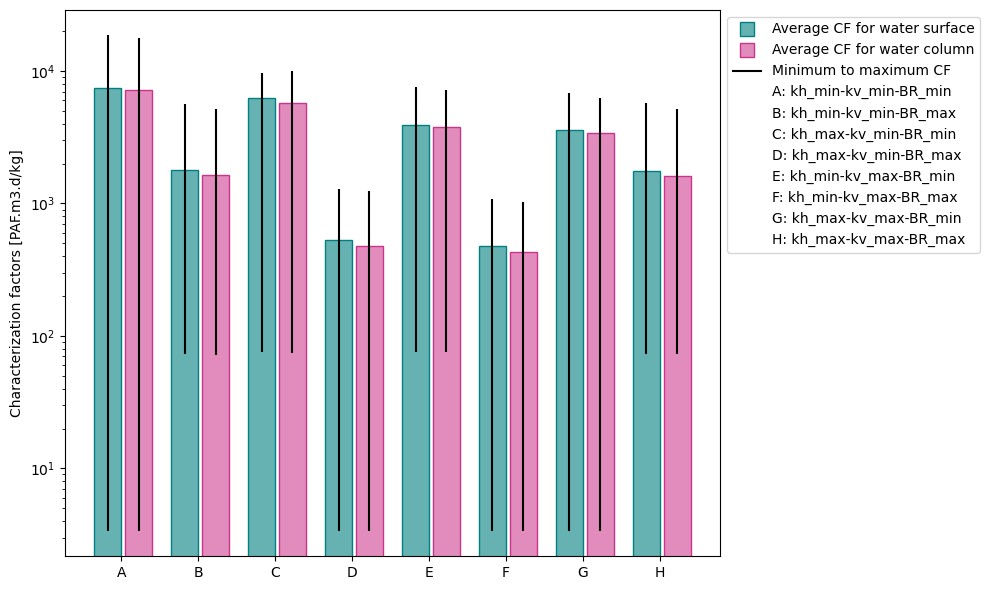

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.lines as mlines

# Load the data
df = pd.read_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\CF_env.xlsx")

# Rename the columns for clarity
df.columns = ['Category', 'Simulation', 'Impact_Type', 'beach', 'water surface', 'water column', 'sediments']

averages = {}
mins = {}
maxs = {}

# Calculate the averages, minimums, and maximums
for category, group in df.groupby(df.index // 4):
    category_name = group.iloc[0, 0]  # Get the category name from the 'Category' column
    averages[category_name] = group[['water surface', 'water column']].mean()
    mins[category_name] = group[['water surface', 'water column']].min()
    maxs[category_name] = group[['water surface', 'water column']].max()

# Convert the dictionaries to DataFrames for easier plotting
avg_df = pd.DataFrame(averages).T
mins_df = pd.DataFrame(mins).T
maxs_df = pd.DataFrame(maxs).T

# Ensure all data is numeric
avg_df = avg_df.apply(pd.to_numeric)
mins_df = mins_df.apply(pd.to_numeric)
maxs_df = maxs_df.apply(pd.to_numeric)

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))

# Choose a clearer color palette
colors = ['#66b2b2', '#e28cbe']  # Example colors: teal, pink
edge_colors = ['teal', '#cc338b']  # Darker shades for borders

# Define the bar width and the space between bars
bar_width = 0.35
space_between_bars = 0.05

# Create positions for the bars
num_categories = len(avg_df)
indices = np.arange(num_categories)

# Create custom legend handles for the bars
bar_labels = [f'Average CF for {col}' for col in avg_df.columns]
custom_legend_handles = [
    mlines.Line2D([], [], color=color, marker='s', linestyle='None', markersize=10, label=label, markeredgecolor=edge_color)
    for color, edge_color, label in zip(colors, edge_colors, bar_labels)
]

# Plot each set of bars separately to adjust their positions
for i, col in enumerate(avg_df.columns):
    bar_positions = indices + (i * (bar_width + space_between_bars))
    ax.bar(bar_positions, avg_df[col], width=bar_width, color=colors[i], edgecolor=edge_colors[i], capsize=5)

    # Add vertical lines for min and max values
    for j, category in enumerate(avg_df.index):
        ax.vlines(bar_positions[j], mins_df.loc[category, col], maxs_df.loc[category, col], color='black')

# Customize the plot
ax.set_ylabel('Characterization factors [PAF.m3.d/kg]')
ax.set_yscale('log')  # Set y-axis to logarithmic scale
ax.set_xticks(indices + bar_width / 2)
#ax.set_xticklabels(['kh_min-kv_min-BR_min', 'kh_min-kv_min-BR_max', 'kh_max-kv_min-BR_min', 'kh_max-kv_min-BR_max', 
                    #'kh_min-kv_max-BR_min', 'kh_min-kv_max-BR_max', 'kh_max-kv_max-BR_min', 'kh_max-kv_max-BR_max'], rotation=45, ha='right')

ax.set_xticklabels(["A", "B", "C", "D", "E", "F", "G", "H"])

# Descriptions
descriptions = ['kh_min-kv_min-BR_min', 'kh_min-kv_min-BR_max', 'kh_max-kv_min-BR_min', 'kh_max-kv_min-BR_max', 
                    'kh_min-kv_max-BR_min', 'kh_min-kv_max-BR_max', 'kh_max-kv_max-BR_min', 'kh_max-kv_max-BR_max']

# Combine letters with their descriptions
description_labels = [f"{letter}: {desc}" for letter, desc in zip(["A", "B", "C", "D", "E", "F", "G", "H"], descriptions)]
description_legend_handles = [mlines.Line2D([], [], color='none', marker='None', linestyle='None', label=label) for label in description_labels]

#ax.legend(handles=all_legend_handles, loc="upper left", bbox_to_anchor=(1, 1))

# Add a custom legend entry for the vertical lines
line = mlines.Line2D([], [], color='black', label='Minimum to maximum CF')
custom_legend_handles.append(line)
all_legend_handles = custom_legend_handles + description_legend_handles 
ax.legend(handles=all_legend_handles, loc = "upper left", bbox_to_anchor = (1, 1))

plt.tight_layout()

plt.savefig("CF_env_ws-wc.pdf", format="pdf", dpi=1000)

# Show the plot
plt.show()


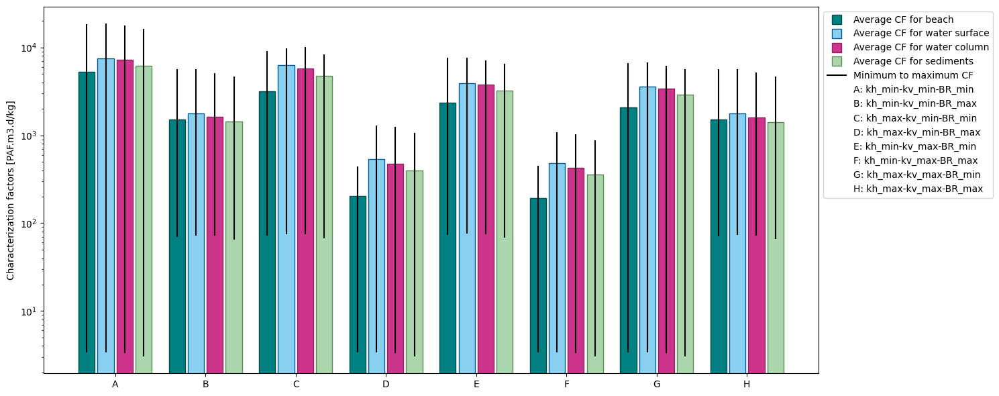

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.lines as mlines

# Load the data
df = pd.read_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\CF_env.xlsx")

# Rename the columns for clarity
df.columns = ['Category', 'Simulation', 'Impact_Type', 'beach', 'water surface', 'water column', 'sediments']

averages = {}
mins = {}
maxs = {}

# Calculate the averages, minimums, and maximums
for category, group in df.groupby(df.index // 4):
    category_name = group.iloc[0, 0]  # Get the category name from the 'Category' column
    averages[category_name] = group[['beach', 'water surface', 'water column', 'sediments']].mean()
    mins[category_name] = group[['beach', 'water surface', 'water column', 'sediments']].min()
    maxs[category_name] = group[['beach', 'water surface', 'water column', 'sediments']].max()

# Convert the dictionaries to DataFrames for easier plotting
avg_df = pd.DataFrame(averages).T
mins_df = pd.DataFrame(mins).T
maxs_df = pd.DataFrame(maxs).T

# Ensure all data is numeric
avg_df = avg_df.apply(pd.to_numeric)
mins_df = mins_df.apply(pd.to_numeric)
maxs_df = maxs_df.apply(pd.to_numeric)

# Plotting
fig, ax = plt.subplots(figsize=(15, 6))

# Define colors and edge colors (make sure they match the number of columns)
colors = ['teal', "#89CFF0", "#cc338b", "#abd5ab"]
edge_colors = ['#004c4c', "#005b99", "#8a2462", "#5b8a5b"]

# Define bar width and space between bars
bar_width = 0.18
space_between_bars = 0.03

# Create positions for the bars
num_categories = len(avg_df)
indices = np.arange(num_categories)

# Plot each set of bars separately to adjust their positions
for i, col in enumerate(avg_df.columns):
    bar_positions = indices + (i * (bar_width + space_between_bars))
    ax.bar(bar_positions, avg_df[col], width=bar_width, color=colors[i], edgecolor=edge_colors[i], capsize=5)

    # Add vertical lines for min and max values
    for j, category in enumerate(avg_df.index):
        ax.vlines(bar_positions[j], mins_df.loc[category, col], maxs_df.loc[category, col], color='black')

# Customize the plot
ax.set_ylabel('Characterization factors [PAF.m3.d/kg]')
ax.set_yscale('log')  # Set y-axis to logarithmic scale
group_width = len(avg_df.columns) * (bar_width + space_between_bars) - space_between_bars
center_positions = indices + group_width / 2 - bar_width / 2

# Set x-ticks and labels
ax.set_xticks(center_positions)
ax.set_xticklabels(["A", "B", "C", "D", "E", "F", "G", "H"])#, rotation=45, ha='right')


# Add descriptions for A, B, C, D, etc.
descriptions = [
    "kh_min-kv_min-BR_min", "kh_min-kv_min-BR_max", 
    "kh_max-kv_min-BR_min", "kh_max-kv_min-BR_max", 
    "kh_min-kv_max-BR_min", "kh_min-kv_max-BR_max", 
    "kh_max-kv_max-BR_min", "kh_max-kv_max-BR_max"
]

# Combine letters with their descriptions
description_labels = [f"{letter}: {desc}" for letter, desc in zip(["A", "B", "C", "D", "E", "F", "G", "H"], descriptions)]

# Create a custom legend for the descriptions
description_legend_handles = [mlines.Line2D([], [], color='none', marker='None', linestyle='None', label=label) for label in description_labels]

# Create custom legend handles for the bars
bar_labels = [f'Average CF for {col}' for col in avg_df.columns]
custom_legend_handles = [
    mlines.Line2D([], [], color=color, marker='s', linestyle='None', markersize=10, label=label, markeredgecolor=edge_color)
    for color, edge_color, label in zip(colors, edge_colors, bar_labels)
]

# Add a custom legend entry for the vertical lines
line = mlines.Line2D([], [], color='black', label='Minimum to maximum CF')
custom_legend_handles.append(line)

# Combine all legend handles
all_legend_handles = custom_legend_handles + description_legend_handles

ax.legend(handles=all_legend_handles, loc="upper left", bbox_to_anchor=(1, 1))

plt.tight_layout()

# Save the plot
plt.savefig("CF_env.pdf", format="pdf", dpi=1000)

# Show the plot
plt.show()


# 6. Sensitivity Analysis

## 6.1 For the FFs

In [34]:
# Add 10% for each k once at a time
k_matrix_cat_SA = {}
FF_matrix_cat_SA = {x: pd.DataFrame() for x in rates.index}
CF_matrix_cat_SA = {x: pd.DataFrame() for x in rates.index}
for cat in rates.index:
    for k in [
        "k_deg_fast",
        "k_deg_medium",
        "k_ws_wc",
        "k_wc_sed",
        "k_burial",
        "k_resuspension",
        "k_resurfacing",
        "k_deg_slow",
    ]:
        k_matrix = pd.DataFrame(0,index=["b.C", "ws.C", "wc.C", "sed.C"], columns=["b.C", "ws.C", "wc.C", "sed.C"],)
        k_deg_slow = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Slow"), categories[cat]["shape"],]/ 365.25)
        k_deg_fast = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Fast"), categories[cat]["shape"],]/ 365.25)
        k_deg_medium = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Medium"),categories[cat]["shape"],]/ 365.25)

        k_ws_wc = rates.loc[cat, "median_ws"]
        k_wc_sed = rates.loc[cat, "median_wc"]

        string = k
        myVars = vars()
        myVars[string] *= 1.1

        k_matrix.loc["b.C", "b.C"] = k_deg_fast - k_burial - k_resurfacing
        k_matrix.loc["ws.C", "b.C"] = k_resurfacing
        k_matrix.loc["ws.C", "ws.C"] = k_deg_medium - k_ws_wc
        k_matrix.loc["wc.C", "ws.C"] = k_ws_wc
        k_matrix.loc["wc.C", "wc.C"] = k_deg_slow - k_wc_sed
        k_matrix.loc["sed.C", "wc.C"] = k_wc_sed
        k_matrix.loc["wc.C", "sed.C"] = k_resuspension
        k_matrix.loc["sed.C", "sed.C"] = k_deg_slow - k_burial - k_resuspension

        dff = pd.DataFrame(-np.linalg.inv(k_matrix),index=["b.C", "ws.C", "wc.C", "sed.C"],columns=["b.C", "ws.C", "wc.C", "sed.C"],)

        # Calculate the CF matrix for each category
        df = EF_matrix.dot(dff)
        df.index = ["CF [PAF.m3.d/kg]"]

        dff = pd.concat([dff], keys=[k])
        FF_matrix_cat_SA[cat] = pd.concat([FF_matrix_cat_SA[cat], dff])

        df = pd.concat([df], keys=[k])
        df.index = df.index.swaplevel()

        CF_matrix_cat_SA[cat] = pd.concat([CF_matrix_cat_SA[cat], df])


        k_matrix_cat_SA[cat] = k_matrix

        myVars[string] /= 1.1

In [37]:
# Building the percentage matrices of FF and CF
FF_matrix_percent = dict.fromkeys(CF_matrix_cat_SA)
CF_matrix_cat_percent = dict.fromkeys(CF_matrix_cat_SA)

for j in rates.index:
    dff_fate = pd.DataFrame()
    dff_CF = pd.DataFrame()
    for w in [
        "k_deg_slow",
        "k_deg_fast",
        "k_deg_medium",
        "k_ws_wc",
        "k_wc_sed",
        "k_burial",
        "k_resuspension",
        "k_resurfacing",
    ]:
        FF_percentage = (abs((FF_matrix_cat_SA[j].loc[w] - FF_matrix_cat[j].loc[j]) / FF_matrix_cat[j].loc[j]).fillna(0) * 100)
        CF_percentage = (abs((CF_matrix_cat_SA[j].loc[("CF [PAF.m3.d/kg]", w)] - CF_matrix_cat[j]) / CF_matrix_cat[j]).fillna(0) * 100)

        FF_percentage = pd.concat([FF_percentage], keys=[w])
        CF_percentage = pd.concat([CF_percentage], keys=[w])

        dff_fate = pd.concat([dff_fate, FF_percentage])
        dff_CF = pd.concat([dff_CF, CF_percentage])

    FF_matrix_percent[j] = pd.concat([FF_matrix_percent[j], dff_fate])
    CF_matrix_cat_percent[j] = pd.concat([CF_matrix_cat_percent[j], dff_CF])

In [39]:
# Reformatting to save to excel
FF_excel = pd.DataFrame()
CF_excel = pd.DataFrame()
for i in rates.index:
    dff_fate_excel = pd.concat([FF_matrix_percent[i]], keys=[i])
    dff_CF_excel = pd.concat([CF_matrix_cat_percent[i]], keys=[i])

    FF_excel = pd.concat([FF_excel, dff_fate_excel])
    CF_excel = pd.concat([CF_excel, dff_CF_excel])

In [41]:
FF_excel.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\FF_excel_SA.xlsx")

## 6.2 For the CFs

In [107]:
# Add 10% for each k and EF once at a time

for cat in rates.index:
    k_matrix = pd.DataFrame(0,index=["b.C", "ws.C", "wc.C", "sed.C"], columns=["b.C", "ws.C", "wc.C", "sed.C"],)
    k_deg_slow = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Slow"), categories[cat]["shape"],]/ 365.25)
    k_deg_fast = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Fast"), categories[cat]["shape"],]/ 365.25)
    k_deg_medium = (degradation["Degradation"].loc[(categories[cat]["type"], categories[cat]["size"], "Medium"),categories[cat]["shape"],]/ 365.25)

    k_ws_wc = rates.loc[cat, "median_ws"]
    k_wc_sed = rates.loc[cat, "median_wc"]

    k_matrix.loc["b.C", "b.C"] = k_deg_fast - k_burial - k_resurfacing
    k_matrix.loc["ws.C", "b.C"] = k_resurfacing
    k_matrix.loc["ws.C", "ws.C"] = k_deg_medium - k_ws_wc
    k_matrix.loc["wc.C", "ws.C"] = k_ws_wc
    k_matrix.loc["wc.C", "wc.C"] = k_deg_slow - k_wc_sed
    k_matrix.loc["sed.C", "wc.C"] = k_wc_sed
    k_matrix.loc["wc.C", "sed.C"] = k_resuspension
    k_matrix.loc["sed.C", "sed.C"] = k_deg_slow - k_burial - k_resuspension

    dff = pd.DataFrame(-np.linalg.inv(k_matrix),index=["b.C", "ws.C", "wc.C", "sed.C"],columns=["b.C", "ws.C", "wc.C", "sed.C"],)

    for i in ["ws.C", "wc.C"]:

        EF_matrix_SA = EF_matrix.copy()
        EF_matrix_SA.loc["Physical impacts on biota [PAF.m3/kg]",i] *= 1.1

        # Calculate the CF matrix for each category
        df = EF_matrix_SA.dot(dff)
        df.index = ["CF [PAF.m3.d/kg]"]

        df = pd.concat([df], keys=["EF_"+i])
        df.index = df.index.swaplevel()

        CF_matrix_cat_SA[cat] = pd.concat([CF_matrix_cat_SA[cat], df])

In [110]:
# Building the percentage matrices of FF and CF
for j in rates.index:
    dff_fate = pd.DataFrame()
    dff_CF = pd.DataFrame()
    for w in ["EF_ws.C", "EF_wc.C"]:
        CF_percentage = (abs((CF_matrix_cat_SA[j].loc[("CF [PAF.m3.d/kg]", w)] - CF_matrix_cat[j]) / CF_matrix_cat[j]).fillna(0) * 100)

        CF_percentage = pd.concat([CF_percentage], keys=[w])

        dff_CF = pd.concat([dff_CF, CF_percentage])

    CF_matrix_cat_percent[j] = pd.concat([CF_matrix_cat_percent[j], dff_CF])

In [116]:
# Reformatting to save to excel
CF_excel = pd.DataFrame()
for i in rates.index:
    dff_CF_excel = pd.concat([CF_matrix_cat_percent[i]], keys=[i])

    CF_excel = pd.concat([CF_excel, dff_CF_excel])

In [118]:
CF_excel.to_excel(r"C:\Users\10User\Desktop\carla\Second_article\Processing_results\CF_excel_SA_PAF.xlsx")

# 7. Graphs

## 7.1 Time for each MPs category 

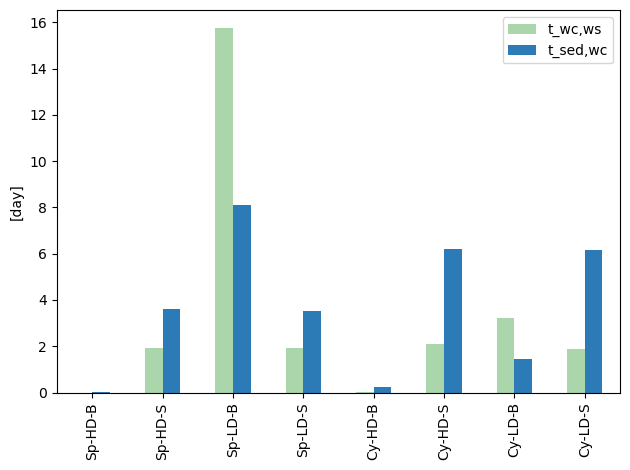

In [39]:
time.plot(kind="bar", color=["#abd5ab", "#2c7bb6"])
plt.ylabel("[day]")
plt.tight_layout()
# plt.savefig('TimeCategories.eps', format = 'eps', dpi = 1000)
plt.savefig("TimeCategories.png", format="png", dpi=1000)

In [266]:
# For FFs SA
fig, axs = plt.subplots(4, 2, figsize=(20, 15), dpi=1000)
df_cat1 = FF_matrix_percent["Sp-HD-B"].unstack()
df_cat2 = FF_matrix_percent["Sp-HD-S"].unstack()
df_cat3 = FF_matrix_percent["Sp-LD-B"].unstack()
df_cat4 = FF_matrix_percent["Sp-LD-S"].unstack()
df_cat5 = FF_matrix_percent["Cy-HD-B"].unstack()
df_cat6 = FF_matrix_percent["Cy-HD-S"].unstack()
df_cat7 = FF_matrix_percent["Cy-LD-B"].unstack()
df_cat8 = FF_matrix_percent["Cy-LD-S"].unstack()

df_cat1 = df_cat1[df_cat1 != 0].dropna(how="all", axis=1).fillna(0)
df_cat2 = df_cat2[df_cat2 != 0].dropna(how="all", axis=1).fillna(0)
df_cat3 = df_cat3[df_cat3 != 0].dropna(how="all", axis=1).fillna(0)
df_cat4 = df_cat4[df_cat4 != 0].dropna(how="all", axis=1).fillna(0)
df_cat5 = df_cat5[df_cat5 != 0].dropna(how="all", axis=1).fillna(0)
df_cat6 = df_cat6[df_cat6 != 0].dropna(how="all", axis=1).fillna(0)
df_cat7 = df_cat7[df_cat7 != 0].dropna(how="all", axis=1).fillna(0)
df_cat8 = df_cat8[df_cat8 != 0].dropna(how="all", axis=1).fillna(0)

df_cat1.T.plot(ax=axs[0, 0], kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"],legend = False)
df_cat2.T.plot(ax=axs[0, 1],kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"],legend = False)
df_cat3.T.plot(ax=axs[1, 0],kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"],legend = False)
df_cat4.T.plot(ax=axs[1, 1],kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"],legend = False)
df_cat5.T.plot(ax=axs[2, 0],kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"],legend = False)
df_cat6.T.plot(ax=axs[2, 1],kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"],legend = False)
df_cat7.T.plot(ax=axs[3, 0],kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"],legend = False)
df_cat8.T.plot(ax=axs[3, 1],kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"],legend = False)

for i in range(0, 4):
    for j in range(0, 2):
        axs[i, j].axvline(0.5, color="k", linestyle="dashed")
        axs[i, j].axvline(1.5, color="k", linestyle="dashed")
        axs[i, j].axvline(2.5, color="k", linestyle="dashed")
        axs[i, j].axvline(3.5, color="k", linestyle="dashed")
        axs[i, j].axvline(4.5, color="k", linestyle="dashed")
        axs[i, j].axvline(5.5, color="k", linestyle="dashed")
        axs[i, j].axvline(6.5, color="k", linestyle="dashed")
        axs[i, j].axvline(7.5, color="k", linestyle="dashed")
        axs[i, j].axvline(8.5, color="k", linestyle="dashed")
        axs[i, j].axvline(9.5, color="k", linestyle="dashed")

        axs[i, j].set_xticklabels(["FF_b,b","FF_sed,b","FF_wc,b","FF_ws,b","FF_sed,ws","FF_wc,ws","FF_ws,ws","FF_sed,wc","FF_wc,wc","FF_sed,sed","FF_wc,sed",],fontdict={"fontsize": 15},)
        # axs[i,j].set_yticklabels (["0", "2%", "4%", "6%", "8%", "10%"], fontdict = {'fontsize': 15})

        plt.sca(axs[i, j])
        #plt.legend(bbox_to_anchor=(1.04, 1), fontsize="15", loc="upper left")
        axs[i, j].set_title(list(FF_matrix_cat.keys())[i * 2 + j], fontweight="bold", size="15")
        axs[i, j].set_ylabel("FF percentage [%]", fontsize=15) 

        

fig.subplots_adjust(bottom=0.15)

handles, labels = ax.get_legend_handles_labels()
formatted_labels = [label.split(', ')[0].strip("()'") for label in labels]
legend = fig.legend(
    handles, formatted_labels, 
    loc='lower center', 
    bbox_to_anchor=(0.5, -0.05),  # Adjust this value to move the legend up/down
    fontsize="15", 
    ncol=4  # Number of columns in the legend
)

plt.tight_layout()
plt.savefig("SA_graph.pdf", bbox_inches='tight', bbox_extra_artists=(legend,))
plt.show()

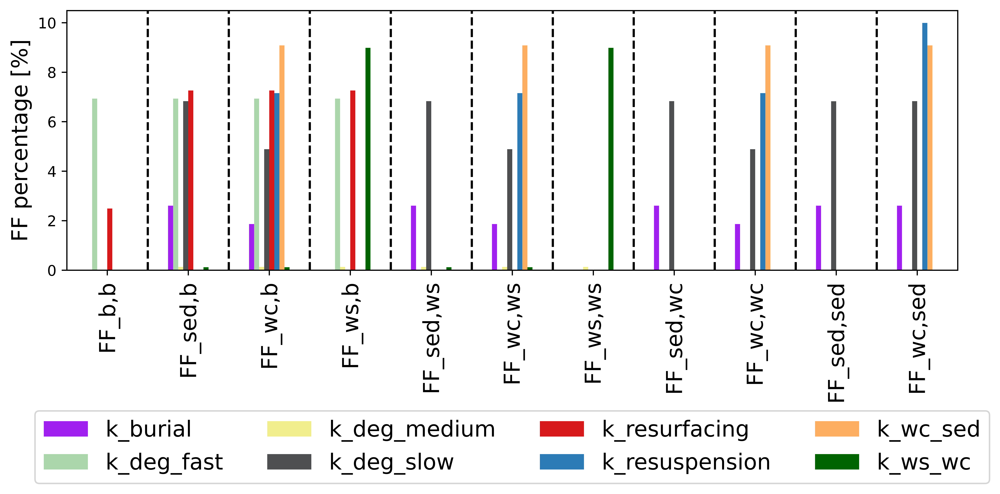

In [92]:
# Figure for FF Sp-LD-S
fig, ax = plt.subplots(figsize=(10, 5), dpi=1000)
df_cat3 = FF_matrix_percent["Sp-LD-S"].unstack()

df_cat3 = df_cat3[df_cat3 != 0].dropna(how="all", axis=1).fillna(0)

df_cat3.T.plot(ax=ax, kind="bar",color=["#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400"])

# Add vertical dashed lines
for x in range (0,10):
   ax.axvline(x+0.5, color="k", linestyle="dashed")
ax.set_xticklabels(["FF_b,b","FF_sed,b","FF_wc,b","FF_ws,b","FF_sed,ws","FF_wc,ws","FF_ws,ws","FF_sed,wc","FF_wc,wc","FF_sed,sed","FF_wc,sed",],fontdict={"fontsize": 15},)

ax.set_ylabel("FF percentage [%]", fontsize=15) 

fig.subplots_adjust(bottom=0.3)

plt.sca(ax)
plt.legend(
    bbox_to_anchor=(0.5, -0.5),  # Adjust position to be at the bottom
    loc="upper center",           # Place the legend at the bottom center
    fontsize="15",                
    ncol=4                        # Number of columns in the legend
)

plt.tight_layout()
plt.savefig("graphiques_SP-LD-S.pdf")
plt.show()

In [267]:
# For CFs SA

fig, axs = plt.subplots(4, 2, figsize=(20, 15), dpi=1000)
df_cat1 = CF_matrix_cat_percent["Sp-HD-B"].unstack()
df_cat2 = CF_matrix_cat_percent["Sp-HD-S"].unstack()
df_cat3 = CF_matrix_cat_percent["Sp-LD-B"].unstack()
df_cat4 = CF_matrix_cat_percent["Sp-LD-S"].unstack()
df_cat5 = CF_matrix_cat_percent["Cy-HD-B"].unstack()
df_cat6 = CF_matrix_cat_percent["Cy-HD-S"].unstack()
df_cat7 = CF_matrix_cat_percent["Cy-LD-B"].unstack()
df_cat8 = CF_matrix_cat_percent["Cy-LD-S"].unstack()

df_cat1 = df_cat1[df_cat1 != 0].dropna(how="all", axis=1).fillna(0)
df_cat2 = df_cat2[df_cat2 != 0].dropna(how="all", axis=1).fillna(0)
df_cat3 = df_cat3[df_cat3 != 0].dropna(how="all", axis=1).fillna(0)
df_cat4 = df_cat4[df_cat4 != 0].dropna(how="all", axis=1).fillna(0)
df_cat5 = df_cat5[df_cat5 != 0].dropna(how="all", axis=1).fillna(0)
df_cat6 = df_cat6[df_cat6 != 0].dropna(how="all", axis=1).fillna(0)
df_cat7 = df_cat7[df_cat7 != 0].dropna(how="all", axis=1).fillna(0)
df_cat8 = df_cat8[df_cat8 != 0].dropna(how="all", axis=1).fillna(0)

df_cat1.T.plot(ax=axs[0, 0], kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)
df_cat2.T.plot(ax=axs[0, 1],kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)
df_cat3.T.plot(ax=axs[1, 0],kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)
df_cat4.T.plot(ax=axs[1, 1],kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)
df_cat5.T.plot(ax=axs[2, 0],kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)
df_cat6.T.plot(ax=axs[2, 1],kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)
df_cat7.T.plot(ax=axs[3, 0],kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)
df_cat8.T.plot(ax=axs[3, 1],kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)

for i in range(0, 4):
    for j in range(0, 2):
        axs[i, j].axvline(0.5, color="k", linestyle="dashed")
        axs[i, j].axvline(1.5, color="k", linestyle="dashed")
        axs[i, j].axvline(2.5, color="k", linestyle="dashed")

        axs[i, j].set_xticklabels(["CF_b","CF_ws","CF_wc","CF_sed",],fontdict={"fontsize": 15},)

        plt.sca(axs[i, j])
        axs[i, j].set_title(list(FF_matrix_cat.keys())[i * 2 + j], fontweight="bold", size="15")
        axs[i, j].set_ylabel("CF percentage [%]", fontsize=15)         
        

fig.subplots_adjust(bottom=0.15)

handles, labels = axs[0,0].get_legend_handles_labels()
formatted_labels = [label.split(', ')[0].strip("()'") for label in labels]
legend = fig.legend(
    handles, formatted_labels, 
    loc='lower center', 
    bbox_to_anchor=(0.5, -0.05),  # Adjust this value to move the legend up/down
    fontsize="15", 
    ncol=5  # Number of columns in the legend
)

plt.tight_layout()
plt.savefig("CF_SA_percent.pdf", bbox_inches='tight', bbox_extra_artists=(legend,))
plt.show()

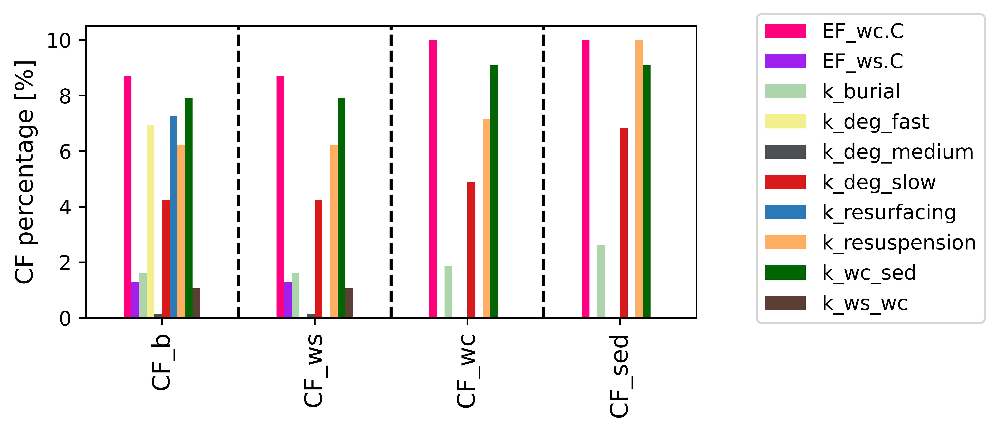

In [263]:
# For CFs SA 'Sp-LD-S'
fig, axs = plt.subplots(figsize=(5, 3), dpi=1000)

df_cat4 = CF_matrix_cat_percent["Sp-LD-S"].unstack()

df_cat4 = df_cat4[df_cat4 != 0].dropna(how="all", axis=1).fillna(0)

df_cat4.T.plot(ax=axs,kind="bar",color=["#FF007F","#A020F0","#abd5ab", "#f1ee8e", "#4E4F50", "#d7191c", "#2c7bb6","#fdae61", "#006400", "#5b3e31"],legend = False)

# Add vertical dashed lines
for x in range (0,3):
   axs.axvline(x+0.5, color="k", linestyle="dashed")
   axs.set_ylabel("CF percentage [%]", fontsize=12) 

axs.set_xticklabels(["CF_b","CF_ws","CF_wc","CF_sed"],fontdict={"fontsize": 12},)
plt.sca(axs)
   
fig.subplots_adjust(bottom=0.3)
#plt.legend(bbox_to_anchor=(1.04, 1), fontsize="12", loc="upper left")


handles, labels = axs.get_legend_handles_labels()
formatted_labels = [label.split(', ')[0].strip("()'") for label in labels]
legend = fig.legend(handles, formatted_labels, loc='upper left', bbox_to_anchor=(1.04, 1), fontsize="10", ncol=1)

plt.tight_layout()
plt.savefig("SA_CF_single.pdf", bbox_inches='tight', bbox_extra_artists=(legend,))
plt.show()

## 7.1 Residence time in sediments

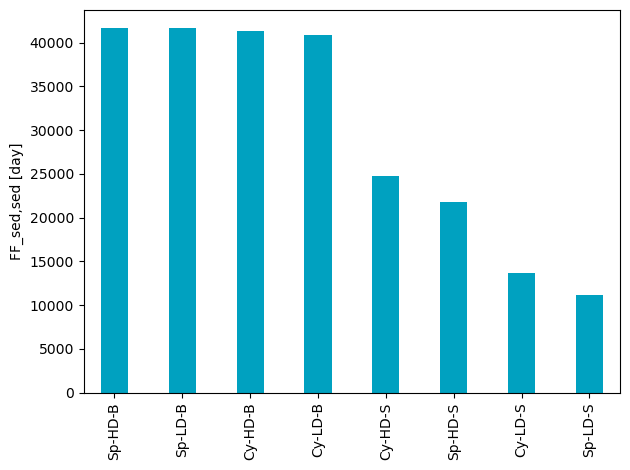

In [42]:
values = {
    'Category': ['Sp-HD-B', 'Sp-HD-S', 'Sp-LD-B', 'Sp-LD-S', 'Cy-HD-B', 'Cy-HD-S', 'Cy-LD-B', 'Cy-LD-S'],
    #'FF_sed,sed [day]': [12673.57, 9918.37, 12672.15, 6912.63, 12647.94, 10487.82, 12595.56, 7797.48]
    #'FF_sed,sed [year]': [18.93, 21.35, 27.16, 28.71, 34.48, 34.63, 34.69, 34.699]
    #'FF_sed,sed [year]': [34.699,34.69,34.63,34.48,28.71,27.16,21.35,18.93]
    #'FF_sed,sed [day]': [6912.63, 7797.48, 9918.37, 10487.82, 12595.56, 12647.94, 12672.15, 12673.57]
    #'FF_sed,sed [day]':[12679.57, 12672.15, 12647.94, 12595.56, 10487.82, 9918.37, 7797.48, 6912.63]
    'FF_sed,sed [day]':[41659.0628990754, 41643.7891048291, 41383.4008269971, 40827.8867832847, 24722.6559891202, 21775.5640166574, 13633.889524773, 11140.4908671672]

}

valuesTable = pd.DataFrame(values)

ax = valuesTable.plot(kind='bar', color=["#00A1C0"], width=0.4)
#ax.set_xticklabels(['Sp-HD-B', 'Sp-HD-S', 'Sp-LD-B', 'Sp-LD-S', 'Cy-HD-B', 'Cy-HD-S', 'Cy-LD-B', 'Cy-LD-S'])
#ax.set_xticklabels(['Sp-LD-S', "Cy-LD-S", 'Sp-HD-S', 'Cy-HD-S', 'Cy-LD-B', 'Cy-HD-B', 'Sp-LD-B', 'Sp-HD-B'])
ax.set_xticklabels(['Sp-HD-B', 'Sp-LD-B', 'Cy-HD-B', 'Cy-LD-B', 'Cy-HD-S', 'Sp-HD-S', 'Cy-LD-S', 'Sp-LD-S'])
plt.ylabel('FF_sed,sed [day]')
plt.legend().remove()

plt.tight_layout()
plt.savefig("FF_sed,sed.pdf", dpi=800)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


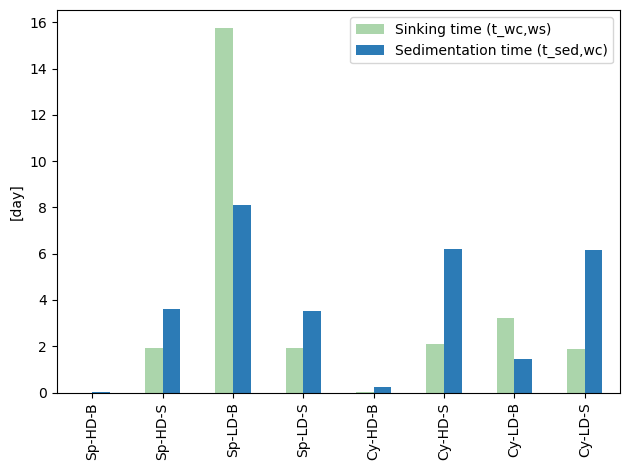

In [43]:
time1 = time
new_columns = {"t_ws.wc": "t_wc,ws", "t_wc.sed": "t_sed,wc"}
time1.rename(columns=new_columns, inplace=True)

# Plotting the data
ax = time1.plot(kind="bar", color=["#abd5ab", "#2c7bb6"])

# Set labels
plt.ylabel("[day]")
plt.tight_layout()

#Set legend
ax.legend(['Sinking time (t_wc,ws)','Sedimentation time (t_sed,wc)'])

# Save figure
plt.savefig("TimePerCategories.eps", format="eps", dpi=1000)
# plt.savefig("TimePerCategory.png", format="png", dpi=1000)